# Enhanced Sentinel-2 AI Compression Inference & Analysis

This notebook provides a comprehensive inference pipeline and analysis for the Sentinel-2 AI compression model. It includes:

## Key Features:
- **Chunked Processing**: Handles large Zarr datasets with memory-efficient chunk-based processing
- **Comprehensive Metrics**: All metrics from post_training.py (PSNR, SSIM, SAM, RMSE)
- **Enhanced Visualizations**: Improved plots for model analysis and compression statistics
- **Model Introspection**: Bottleneck analysis and compression ratio calculations
- **3D Analysis**: Interactive plots for metric relationships

## Pipeline Overview:
1. **Data Loading**: Load Zarr datasets and prepare chunked processing
2. **Model Inference**: Process chunks through trained model
3. **Reconstruction**: Reassemble chunks to full-resolution imagery
4. **Metrics Calculation**: Compute comprehensive metrics
5. **Visualization**: Generate analysis plots and comparisons
6. **Compression Analysis**: Analyze model bottleneck and compression ratios

## 1. Import Libraries and Setup Environment

In [1]:
import os
import sys
import warnings
import time
from pathlib import Path

# Data processing
import numpy as np
import pandas as pd
import xarray as xr
from tqdm import tqdm

# PyTorch
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.gridspec import GridSpec

# Project imports
sys.path.append('../')
from data.dataset import Sentinel2ZarrDataset
from model_zoo.models import define_model
from utils.utils import load_config
from training.metrics import MultiSpectralMetrics

# Configure warnings and display
warnings.filterwarnings('ignore')
sns.set_palette("pastel")

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.6.0+cu124
CUDA available: True
CUDA device: NVIDIA L40S


## 2. Utility Functions and Data Preparation

### Core Functions for Data Processing and Analysis

In [2]:
def prepare_paths(path_dir):
    """
    Prepare input and output file paths from CSV metadata.

    Args:
        path_dir (str): Directory containing input.csv and target.csv files

    Returns:
        tuple: (df_input, df_output) DataFrames with path information
    """
    df_input = pd.read_csv(f"{path_dir}/input.csv")
    df_output = pd.read_csv(f"{path_dir}/target.csv")

    df_input["path"] = df_input["Name"].apply(
        lambda x: os.path.join(path_dir, "input", os.path.basename(x).replace(".SAFE", ""))
    )
    df_output["path"] = df_output["Name"].apply(
        lambda x: os.path.join(path_dir, "target", os.path.basename(x).replace(".SAFE", ""))
    )

    return df_input, df_output


def normalize_data(data_array):
    """
    Normalize multi-band satellite data and create validity masks.

    Args:
        data_array (numpy.ndarray): Input data array [H, W, C]

    Returns:
        tuple: (normalized_data, valid_masks) both as [H, W, C] arrays
    """
    normalized_data = []
    valid_masks = []

    for i in range(data_array.shape[2]):
        band_data = data_array[:, :, i]
        valid_mask = (band_data > 0)

        result = band_data.copy().astype(np.float32)
        result[~valid_mask] = 0.0

        normalized_data.append(result)
        valid_masks.append(valid_mask)

    return np.dstack(normalized_data), np.dstack(valid_masks)


def tensor_size_MB(tensor: torch.Tensor) -> float:
    """Return size of torch tensor in MB."""
    return tensor.numel() * tensor.element_size() / (1024 ** 2)


def tensor_list_size_MB(tensor_list):
    """
    Compute total size in MB for a list of tensors.
    """
    total_bytes = sum(t.numel() * t.element_size() for t in tensor_list)
    return total_bytes / (1024 ** 2)


def calculate_compression_stats(input_tensor, bottleneck_tensor):
    """
    Calculate comprehensive compression statistics between input and bottleneck tensors.

    Args:
        input_tensor (torch.Tensor): Input tensor
        bottleneck_tensor (torch.Tensor): Bottleneck tensor

    Returns:
        dict: Dictionary containing compression statistics
    """
    # Basic shape information
    input_shape = tuple(input_tensor.shape)
    bottleneck_shape = tuple(bottleneck_tensor.shape)

    # Element counts
    input_elements = input_tensor.numel()
    bottleneck_elements = bottleneck_tensor.numel()

    # Compression calculations
    compression_ratio = input_elements / bottleneck_elements if bottleneck_elements > 0 else float('inf')
    size_reduction_percent = (1 - bottleneck_elements / input_elements) * 100 if input_elements > 0 else 0

    # Spatial compression (assuming last two dimensions are spatial)
    input_spatial = input_tensor.shape[-2] * input_tensor.shape[-1] if len(input_tensor.shape) >= 2 else 1
    bottleneck_spatial = bottleneck_tensor.shape[-2] * bottleneck_tensor.shape[-1] if len(bottleneck_tensor.shape) >= 2 else 1
    spatial_compression = input_spatial / bottleneck_spatial if bottleneck_spatial > 0 else float('inf')

    # Channel compression (assuming second dimension is channels for 4D tensors)
    if len(input_tensor.shape) >= 2 and len(bottleneck_tensor.shape) >= 2:
        input_channels = input_tensor.shape[1] if len(input_tensor.shape) > 1 else 1
        bottleneck_channels = bottleneck_tensor.shape[1] if len(bottleneck_tensor.shape) > 1 else 1
        channel_compression = input_channels / bottleneck_channels if bottleneck_channels > 0 else float('inf')
    else:
        channel_compression = 1.0

    # Memory sizes in MB
    input_size_mb = input_tensor.numel() * input_tensor.element_size() / (1024 ** 2)
    bottleneck_size_mb = bottleneck_tensor.numel() * bottleneck_tensor.element_size() / (1024 ** 2)

    return {
        'input_shape': input_shape,
        'bottleneck_shape': bottleneck_shape,
        'input_elements': input_elements,
        'bottleneck_elements': bottleneck_elements,
        'compression_ratio': compression_ratio,
        'size_reduction_percent': size_reduction_percent,
        'spatial_compression': spatial_compression,
        'channel_compression': channel_compression,
        'input_size_mb': input_size_mb,
        'bottleneck_size_mb': bottleneck_size_mb
    }


def plot_3d_scatter(
    df,
    x_col,
    y_col,
    z_col,
    color_col=None,
    labels=None,
    title=None,
    output_path=None,
    color_scale='plasma',
    opacity=0.8,
    marker_size=5
):
    """
    Create interactive 3D scatter plot using Plotly.

    Args:
        df (pandas.DataFrame): Input DataFrame
        x_col (str): Column name for x-axis
        y_col (str): Column name for y-axis
        z_col (str): Column name for z-axis
        color_col (str, optional): Column name for color mapping
        labels (dict, optional): Axis labels mapping
        title (str, optional): Plot title
        output_path (str, optional): Path to save HTML output
        color_scale (str): Color scale for the plot
        opacity (float): Marker opacity
        marker_size (int): Size of markers

    Returns:
        plotly.graph_objects.Figure: Interactive 3D plot
    """
    if not labels:
        labels = {x_col: x_col, y_col: y_col, z_col: z_col}
    if not title:
        title = f'{z_col} vs {x_col} vs {y_col}'
    if not color_col:
        color_col = x_col  # default to x_col if not specified

    fig = px.scatter_3d(
        df,
        x=x_col,
        y=y_col,
        z=z_col,
        color=color_col,
        color_continuous_scale=color_scale,
        opacity=opacity,
        title=title,
        labels=labels
    )

    fig.update_traces(marker=dict(size=marker_size))
    fig.update_layout(
        scene=dict(
            xaxis_title=labels.get(x_col, x_col),
            yaxis_title=labels.get(y_col, y_col),
            zaxis_title=labels.get(z_col, z_col),
            xaxis=dict(gridcolor='lightgray'),
            yaxis=dict(gridcolor='lightgray'),
            zaxis=dict(gridcolor='lightgray'),
        ),
        width=900,
        height=700,
        margin=dict(l=0, r=0, b=0, t=30),
        coloraxis_colorbar=dict(title=labels.get(color_col, color_col))
    )

    if output_path:
        fig.write_html(output_path)

    return fig

## 3. Configuration and Dataset Setup

### Load Configuration and Prepare Data

In [3]:
# Configuration
base_dir = "/mnt/disk/dataset/sentinel-ai-processor"
version = "V4"
res = "60m"
bands = ['b01', 'b02', 'b03', 'b04', 'b05', 'b06', 'b07', 'b09', 'b11', 'b12', 'b8a']
batch_size = 1
target_size = (320, 320)

TEST_DIR = f"{base_dir}/{version}/train/"

df_test_input, df_test_output = prepare_paths(TEST_DIR)

# For demonstration, use subset of test data

print(f"Dataset prepared:")

print(f"Test samples: {len(df_test_output)}")
print(f"Bands: {len(bands)} ({', '.join(bands)})")
print(f"Resolution: {res}")
print(f"Target chunk size: {target_size}")

# Create dataset and dataloader
dataset = Sentinel2ZarrDataset(
    df_x=df_test_output,
    res=res,
    bands=bands,
    target_size=target_size,
)

loader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0
)

# Device setup
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Dataset prepared:
Test samples: 50
Bands: 11 (b01, b02, b03, b04, b05, b06, b07, b09, b11, b12, b8a)
Resolution: 60m
Target chunk size: (320, 320)
Using device: cuda


## 4. Model Loading and Setup

### Load Pre-trained Model and Configuration

In [4]:
# Model configuration
result_path = "/home/ubuntu/project/sentinel-2-ai-compressor/src/results/2025-08-19_22-18-59"
checkpoint_path = f"{result_path}/checkpoints"

print(f"Loading model configuration from: {result_path}")

# Load configuration
config = load_config(f"{result_path}/config.yaml")

print(" Model Configuration:")
print(f"Model: {config['MODEL']['model_name']}")
print(f"Encoder: {config['MODEL']['encoder_name']}")
print(f"Input channels: {len(config['DATASET']['bands'])}")
print(f"Output channels: {len(config['DATASET']['bands'])}")
print(f"Activation: {config['MODEL']['activation']}")

# Initialize model
model = define_model(
    name=config['MODEL']['model_name'],
    encoder_name=config['MODEL']['encoder_name'],
    encoder_weights=config['MODEL']['encoder_weights'],
    in_channel=len(config['DATASET']['bands']),
    out_channels=len(config['DATASET']['bands']),
    activation=config['MODEL']['activation']
)


# Load trained weights
print("Loading trained model weights...")
model.load_state_dict(torch.load(os.path.join(checkpoint_path, "best_model.pth")))
model = model.to(device)
model.eval()

# Calculate model parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f" Model loaded successfully!")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Model size: ~{total_params * 4 / 1024 / 1024:.1f} MB (FP32)")

Loading model configuration from: /home/ubuntu/project/sentinel-2-ai-compressor/src/results/2025-08-19_22-18-59
 Model Configuration:
Model: Unet
Encoder: timm-efficientnet-b2
Input channels: 11
Output channels: 11
Activation: relu
Loading trained model weights...
 Model loaded successfully!
Total parameters: 10,050,045
Trainable parameters: 10,050,045
Model size: ~38.3 MB (FP32)


## 5. Model Inference and Processing

### Run Inference on Test Data with Bottleneck Analysis

In [5]:

# Bottleneck analysis setup
activations = {}

def get_activation(name):
    """Hook function to capture intermediate activations."""
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

# Register hook for bottleneck analysis
activations.clear()
hook_handle = model[0].encoder.blocks[5].register_forward_hook(get_activation("bottleneck_layer"))

print("Starting inference processing...")

# Initialize metrics tracking
inference_stats = {
    'processing_times': [],
    'compression_ratios': [],
    'input_shapes': [],
    'output_shapes': [],
    'bottleneck_shapes': []
}

# Process data through model
model.eval()
all_outputs = []
all_inputs = []
all_masks = []
all_meta = []
all_bottleneck = []

test_metrics_tracker = MultiSpectralMetrics(bands=bands, device=device)
metrics_dict = {f"{metric}_{band}": [] for band in test_metrics_tracker.bands for metric in ['psnr', 'rmse', 'ssim', 'sam']}
test_metrics_tracker.reset()

with torch.no_grad():
    with tqdm(total=len(loader.dataset), ncols=120, colour='#3eedc4') as t:
        t.set_description("Processing Inference")

        for batch_idx, (chunks_grid, masks_grid, meta) in enumerate(loader):
            start_time = time.time()

            B, ny, nx, C, H, W = chunks_grid.shape
            chunks_tensor = chunks_grid.view(B * ny * nx, C, H, W).to(device)
            masks_tensor = masks_grid.view(B * ny * nx, C, H, W).to(device)

            # Run inference
            outputs = model(chunks_tensor)
            print(outputs.shape)

            # Record processing time
            processing_time = time.time() - start_time
            inference_stats['processing_times'].append(processing_time)
            test_metrics_tracker.reset()
            test_metrics_tracker.update(outputs, chunks_tensor, masks_tensor)
            metrics = test_metrics_tracker.compute()

            for band in test_metrics_tracker.bands:
                for metric_name in ['psnr', 'rmse', 'ssim', 'sam']:
                    metrics_dict[f"{metric_name}_{band}"].append(metrics[band][metric_name])
                # Store results
            all_outputs.append(outputs)
            all_inputs.append(chunks_tensor)
            all_masks.append(masks_tensor)
            all_meta.append(meta)

            # Calculate compression statistics
            if "bottleneck_layer" in activations:
                bottleneck_tensor = activations["bottleneck_layer"]
                all_bottleneck.append(bottleneck_tensor)
            t.set_postfix({
                'Time': f'{processing_time:.2f}s',
                'Chunks': f'{B * ny * nx}',

            })
            t.update(B)

# Clean up hook
hook_handle.remove()
print(" Inference completed!")
print(f"Total batches processed: {len(all_outputs)}")
print(f"Average processing time: {np.mean(inference_stats['processing_times']):.2f}s per batch")
if inference_stats['compression_ratios']:
    print(f"Average compression ratio: {np.mean(inference_stats['compression_ratios']):.1f}x")

Starting inference processing...


Processing Inference:   0%|                                                                      | 0/50 [00:00<?, ?it/s]

torch.Size([36, 11, 320, 320])


Processing Inference:   4%|█▌                                     | 2/50 [00:05<01:57,  2.45s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:   6%|██▎                                    | 3/50 [00:07<01:43,  2.21s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:   8%|███                                    | 4/50 [00:08<01:33,  2.02s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  10%|███▉                                   | 5/50 [00:10<01:27,  1.95s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  12%|████▋                                  | 6/50 [00:12<01:25,  1.94s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  14%|█████▍                                 | 7/50 [00:14<01:23,  1.94s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  16%|██████▏                                | 8/50 [00:16<01:24,  2.02s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  18%|███████                                | 9/50 [00:18<01:21,  1.99s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  20%|███████▌                              | 10/50 [00:20<01:20,  2.01s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  22%|████████▎                             | 11/50 [00:22<01:17,  1.98s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  24%|█████████                             | 12/50 [00:24<01:11,  1.89s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  26%|█████████▉                            | 13/50 [00:26<01:09,  1.89s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  28%|██████████▋                           | 14/50 [00:27<01:06,  1.86s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  30%|███████████▍                          | 15/50 [00:29<01:06,  1.91s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  32%|████████████▏                         | 16/50 [00:31<01:04,  1.90s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  34%|████████████▉                         | 17/50 [00:33<01:01,  1.86s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  36%|█████████████▋                        | 18/50 [00:35<00:59,  1.86s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  38%|██████████████▍                       | 19/50 [00:37<00:57,  1.86s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  40%|███████████████▏                      | 20/50 [00:39<00:56,  1.87s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  42%|███████████████▉                      | 21/50 [00:41<00:59,  2.05s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  44%|████████████████▋                     | 22/50 [00:43<00:57,  2.07s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  46%|█████████████████▍                    | 23/50 [00:45<00:56,  2.08s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  48%|██████████████████▏                   | 24/50 [00:48<00:54,  2.11s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  50%|███████████████████                   | 25/50 [00:50<00:52,  2.09s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  52%|███████████████████▊                  | 26/50 [00:52<00:49,  2.06s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  54%|████████████████████▌                 | 27/50 [00:54<00:46,  2.04s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  56%|█████████████████████▎                | 28/50 [00:56<00:46,  2.13s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  58%|██████████████████████                | 29/50 [00:58<00:43,  2.05s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  60%|██████████████████████▊               | 30/50 [01:00<00:40,  2.03s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  62%|███████████████████████▌              | 31/50 [01:02<00:38,  2.02s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  64%|████████████████████████▎             | 32/50 [01:04<00:35,  1.97s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  66%|█████████████████████████             | 33/50 [01:06<00:34,  2.02s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  68%|█████████████████████████▊            | 34/50 [01:08<00:33,  2.08s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  70%|██████████████████████████▌           | 35/50 [01:10<00:30,  2.03s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  72%|███████████████████████████▎          | 36/50 [01:12<00:28,  2.07s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  74%|████████████████████████████          | 37/50 [01:14<00:26,  2.07s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  76%|████████████████████████████▉         | 38/50 [01:16<00:24,  2.06s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  78%|█████████████████████████████▋        | 39/50 [01:18<00:22,  2.04s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  80%|██████████████████████████████▍       | 40/50 [01:20<00:20,  2.05s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  82%|███████████████████████████████▏      | 41/50 [01:22<00:18,  2.11s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  84%|███████████████████████████████▉      | 42/50 [01:25<00:16,  2.10s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  86%|████████████████████████████████▋     | 43/50 [01:26<00:14,  2.05s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  88%|█████████████████████████████████▍    | 44/50 [01:29<00:12,  2.06s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  90%|██████████████████████████████████▏   | 45/50 [01:31<00:10,  2.15s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  92%|██████████████████████████████████▉   | 46/50 [01:33<00:08,  2.14s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  94%|███████████████████████████████████▋  | 47/50 [01:35<00:06,  2.21s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  96%|████████████████████████████████████▍ | 48/50 [01:38<00:04,  2.29s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference:  98%|█████████████████████████████████████▏| 49/50 [01:40<00:02,  2.20s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])


Processing Inference: 100%|██████████████████████████████████████| 50/50 [01:42<00:00,  2.05s/it, Time=0.02s, Chunks=36]

torch.Size([36, 11, 320, 320])
 Inference completed!
Total batches processed: 50
Average processing time: 0.02s per batch


In [6]:
# Update DataFrame with metrics
for column_name, values in metrics_dict.items():
    df_test_output[column_name] = values

In [7]:
df_test_output.head()

,id_key,Name,S3Path,Footprint,GeoFootprint,cloud_cover,path,processing_baseline,valid_pixel,psnr_b01,...,ssim_b11,sam_b11,psnr_b12,rmse_b12,ssim_b12,sam_b12,psnr_b8a,rmse_b8a,ssim_b8a,sam_b8a
0,S2A_MSIL1C_20210903T102021_N0500_R065_T32TMR,S2A_MSIL2A_20210903T102021_N0500_R065_T32TMR_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2021/09/0...,geography'SRID=4326;POLYGON ((7.70695108472353...,"{'type': 'Polygon', 'coordinates': [[[7.706951...",34.746963,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,99.999940,27.748024,...,0.816479,0.123099,29.263971,0.034419,0.829583,0.169239,28.360863,0.038191,0.856623,0.084125
1,S2B_MSIL1C_20180702T104019_N0500_R008_T31TFM,S2B_MSIL2A_20180702T104019_N0500_R008_T31TFM_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2018/07/0...,geography'SRID=4326;POLYGON ((4.31403528037438...,"{'type': 'Polygon', 'coordinates': [[[4.314035...",8.212475,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,32.652138,...,0.814569,0.114756,30.258106,0.030697,0.843643,0.153179,29.989115,0.031662,0.866605,0.070448
2,S2B_MSIL1C_20180726T102019_N0500_R065_T32UPA,S2B_MSIL2A_20180726T102019_N0500_R065_T32UPA_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2018/07/2...,geography'SRID=4326;POLYGON ((10.4113495060493...,"{'type': 'Polygon', 'coordinates': [[[10.41134...",14.940278,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,30.437412,...,0.813031,0.139611,28.591667,0.037189,0.818505,0.180413,29.556105,0.033281,0.859642,0.096409
3,S2B_MSIL1C_20210815T103629_N0500_R008_T31UFP,S2B_MSIL2A_20210815T103629_N0500_R008_T31UFP_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2021/08/1...,geography'SRID=4326;POLYGON ((4.36027924628366...,"{'type': 'Polygon', 'coordinates': [[[4.360279...",34.562334,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,28.128328,...,0.832787,0.121265,27.923780,0.040162,0.836280,0.173582,28.581669,0.037232,0.874104,0.083385
4,S2A_MSIL1C_20191206T103421_N0500_R108_T31TGL,S2A_MSIL2A_20191206T103421_N0500_R108_T31TGL_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2019/12/0...,geography'SRID=4326;POLYGON ((5.58354883959714...,"{'type': 'Polygon', 'coordinates': [[[5.583548...",2.255814,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,99.999821,19.472582,...,0.657600,0.415912,27.907505,0.040237,0.675807,0.468111,23.976425,0.063267,0.807369,0.136591


In [8]:
# Compute comprehensive compression analysis
print("Computing compression analysis...")

total_input_MB = tensor_list_size_MB(all_inputs)
total_bottleneck_MB = tensor_list_size_MB(all_bottleneck)
compression_factor = total_input_MB / total_bottleneck_MB if total_bottleneck_MB > 0 else float("inf")

print(f"\n" + "="*50)
print(f"COMPREHENSIVE COMPRESSION ANALYSIS")
print(f"="*50)
print(f"Dataset Statistics:")
print(f"Total batches processed: {len(all_inputs)}")
print(f"Chunks per batch: {all_inputs[0].shape[0] if all_inputs else 'N/A'}")
print(f"Input tensor shape: {all_inputs[0].shape if all_inputs else 'N/A'}")
print(f"Bottleneck tensor shape: {all_bottleneck[0].shape if all_bottleneck else 'N/A'}")

print(f"\nMemory Usage:")
print(f"Total input size: {total_input_MB:.2f} MB")
print(f"Total bottleneck size: {total_bottleneck_MB:.2f} MB")
print(f"Memory saved: {total_input_MB - total_bottleneck_MB:.2f} MB")

print(f"\Compression Performance:")
print(f"Compression ratio: {compression_factor:.2f}x")
print(f"Size reduction: {(1 - total_bottleneck_MB/total_input_MB)*100:.1f}%")

# Per-sample analysis
if all_inputs and all_bottleneck:
    sample_input_MB = tensor_size_MB(all_inputs[0])
    sample_bottleneck_MB = tensor_size_MB(all_bottleneck[0])
    sample_compression = sample_input_MB / sample_bottleneck_MB

    print(f"\nPer-Sample Analysis:")
    print(f"Average input per batch: {sample_input_MB:.2f} MB")
    print(f"verage bottleneck per batch: {sample_bottleneck_MB:.2f} MB")
    print(f"Per-batch compression: {sample_compression:.2f}x")

print(f"="*50)

Computing compression analysis...

COMPREHENSIVE COMPRESSION ANALYSIS
Dataset Statistics:
Total batches processed: 50
Chunks per batch: 36
Input tensor shape: torch.Size([36, 11, 320, 320])
Bottleneck tensor shape: torch.Size([36, 208, 10, 10])

Memory Usage:
Total input size: 7734.38 MB
Total bottleneck size: 142.82 MB
Memory saved: 7591.55 MB
\Compression Performance:
Compression ratio: 54.15x
Size reduction: 98.2%

Per-Sample Analysis:
Average input per batch: 154.69 MB
verage bottleneck per batch: 2.86 MB
Per-batch compression: 54.15x


## 6. Image Reconstruction and Assembly

### Reassemble Processed Chunks into Full-Resolution Images

In [9]:
def reassemble_to_original(outputs_grid, meta):
    """
    Reassemble model outputs from chunks back to original raster dimensions.

    Args:
        outputs_grid (torch.Tensor): Grid of output chunks [ny, nx, C, H, W]
        meta (tuple): Metadata (nb_chunks_y, nb_chunks_x, chunk_size_y, chunk_size_x)

    Returns:
        torch.Tensor: Full reconstructed image [C, Y, X]
    """
    # Extract metadata
    nb_chunks_y = int(meta[0][0].item())
    nb_chunks_x = int(meta[1][0].item())
    chunk_size_y = int(meta[2][0].item())
    chunk_size_x = int(meta[3][0].item())

    ny, nx, C, H, W = outputs_grid.shape

    # Calculate full image dimensions
    full_height = nb_chunks_y * chunk_size_y
    full_width = nb_chunks_x * chunk_size_x

    full_image = torch.zeros((C, full_height, full_width))

    # Reassemble chunks
    for i in range(nb_chunks_y):
        for j in range(nb_chunks_x):
            # Resize chunk back to original size
            chunk = F.interpolate(
                outputs_grid[i, j].unsqueeze(0),
                size=(chunk_size_y, chunk_size_x),
                mode="bilinear",
                align_corners=False
            ).squeeze(0)

            # Place chunk in full image
            y_start, y_end = i * chunk_size_y, (i + 1) * chunk_size_y
            x_start, x_end = j * chunk_size_x, (j + 1) * chunk_size_x
            full_image[:, y_start:y_end, x_start:x_end] = chunk

    return full_image


print("Reconstructing full-resolution images...")

output_index = 2

last_outputs = all_outputs[output_index]
last_meta = all_meta[output_index]

B, ny, nx, C, H, W = chunks_grid.shape
outputs_grid = last_outputs.view(B, ny, nx, C, H, W).cpu()

# Reconstruct both samples in the batch
reconstructions = []
for sample_idx in range(B):
    full_reconstruction = reassemble_to_original(outputs_grid[sample_idx], last_meta)
    reconstructions.append(full_reconstruction)
    print(f"Sample {sample_idx + 1} reconstructed: {full_reconstruction.shape}")

print(f"Successfully reconstructed {len(reconstructions)} full-resolution images!")
print(f"Reconstruction shape: {reconstructions[0].shape} ({len(bands)} bands)")
print(f"Spatial resolution: {reconstructions[0].shape[1]} x {reconstructions[0].shape[2]} pixels")


Reconstructing full-resolution images...
Sample 1 reconstructed: torch.Size([11, 1830, 1830])
Successfully reconstructed 1 full-resolution images!
Reconstruction shape: torch.Size([11, 1830, 1830]) (11 bands)
Spatial resolution: 1830 x 1830 pixels


## 7. Enhanced Visualization and Analysis

### Comprehensive Visualization Suite

In [10]:
def create_comprehensive_comparison_plot(input_data, output_data, bands, sample_idx=0, chunk_idx=0):
    """
    Create comprehensive comparison plots for input vs output.

    Args:
        input_data (torch.Tensor): Input tensor
        output_data (torch.Tensor): Output tensor
        bands (list): List of band names
        sample_idx (int): Sample index to visualize
        chunk_idx (int): Chunk index to visualize
    """
    # Convert to numpy and select specific sample/chunk
    if torch.is_tensor(input_data):
        input_np = input_data[chunk_idx].cpu().numpy()
        output_np = output_data[chunk_idx].cpu().numpy()
    else:
        input_np = input_data[chunk_idx]
        output_np = output_data[chunk_idx]

    # Create subplot grid
    n_bands = len(bands)
    n_cols = min(4, n_bands)
    n_rows = (n_bands + n_cols - 1) // n_cols

    fig = plt.figure(figsize=(20, 5 * n_rows))
    gs = GridSpec(n_rows * 3, n_cols, hspace=0.3, wspace=0.3)

    for idx, band in enumerate(bands):
        row = (idx // n_cols) * 3
        col = idx % n_cols

        # Input image
        ax1 = fig.add_subplot(gs[row, col])
        im1 = ax1.imshow(input_np[idx], cmap='viridis', vmin=0, vmax=1)
        ax1.set_title(f'Input - {band}', fontsize=12, fontweight='bold')
        ax1.axis('off')
        plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

        # Output image
        ax2 = fig.add_subplot(gs[row + 1, col])
        im2 = ax2.imshow(output_np[idx], cmap='viridis', vmin=0, vmax=1)
        ax2.set_title(f'Output - {band}', fontsize=12, fontweight='bold')
        ax2.axis('off')
        plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

        # Difference image
        ax3 = fig.add_subplot(gs[row + 2, col])
        diff = np.abs(input_np[idx] - output_np[idx])
        im3 = ax3.imshow(diff, cmap='plasma', vmin=0, vmax=diff.max())
        ax3.set_title(f'Abs Difference - {band}', fontsize=12, fontweight='bold')
        ax3.axis('off')
        plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)

        # Add metrics text
        rmse = np.sqrt(np.mean((input_np[idx] - output_np[idx])**2))
        mae = np.mean(np.abs(input_np[idx] - output_np[idx]))
        ax3.text(0.02, 0.98, f'RMSE: {rmse:.4f}\nMAE: {mae:.4f}',
                transform=ax3.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7),
                fontsize=10)

    plt.suptitle(f'Band Comparison - Sample {sample_idx}, Chunk {chunk_idx}',
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_rgb_composite(reconstruction, bands, figsize=(15, 5)):
    """
    Create RGB composite visualization.

    Args:
        reconstruction (torch.Tensor): Reconstructed image [C, H, W]
        bands (list): List of band names
        figsize (tuple): Figure size
    """
    # Find RGB band indices (B04=Red, B03=Green, B02=Blue)
    rgb_mapping = {'b04': 0, 'b03': 1, 'b02': 2}  # R, G, B
    rgb_indices = []

    for band in ['b04', 'b03', 'b02']:
        if band in bands:
            rgb_indices.append(bands.index(band))
        else:
            print(f"Warning: Band {band} not found for RGB composite")
            return

    if len(rgb_indices) != 3:
        print("Cannot create RGB composite - missing required bands")
        return

    # Extract RGB data
    rgb_data = reconstruction[rgb_indices].detach().numpy()
    rgb_image = np.transpose(rgb_data, (1, 2, 0))

    # Normalize for display
    rgb_image = np.clip(rgb_image, 0, 1)

    # Create visualization
    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # RGB composite
    axes[0].imshow(rgb_image)
    axes[0].set_title('RGB Composite (B04-B03-B02)', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    # Histogram of RGB values
    axes[1].hist(rgb_image[:,:,0].flatten(), bins=50, alpha=0.7, label='Red (B04)', color='red')
    axes[1].hist(rgb_image[:,:,1].flatten(), bins=50, alpha=0.7, label='Green (B03)', color='green')
    axes[1].hist(rgb_image[:,:,2].flatten(), bins=50, alpha=0.7, label='Blue (B02)', color='blue')
    axes[1].set_title('RGB Value Distribution', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Pixel Value')
    axes[1].set_ylabel('Frequency')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def plot_compression_analysis(input_tensor, bottleneck_tensor, figsize=(15, 10)):
    """
    Create comprehensive compression analysis plots.

    Args:
        input_tensor (torch.Tensor): Input tensor
        bottleneck_tensor (torch.Tensor): Bottleneck tensor
        figsize (tuple): Figure size
    """
    compression_stats = calculate_compression_stats(input_tensor, bottleneck_tensor)

    fig, axes = plt.subplots(2, 3, figsize=figsize)

    # Compression statistics text
    axes[0, 0].text(0.1, 0.7, f"""Compression Analysis:

Input Shape: {compression_stats['input_shape']}
Bottleneck Shape: {compression_stats['bottleneck_shape']}

Elements:
• Input: {compression_stats['input_elements']:,}
• Bottleneck: {compression_stats['bottleneck_elements']:,}

Compression Ratio: {compression_stats['compression_ratio']:.2f}x
Size Reduction: {compression_stats['size_reduction_percent']:.1f}%
Spatial Compression: {compression_stats['spatial_compression']:.2f}x
    """, fontsize=12, verticalalignment='top',
                     bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
    axes[0, 0].set_xlim(0, 1)
    axes[0, 0].set_ylim(0, 1)
    axes[0, 0].axis('off')
    axes[0, 0].set_title('Compression Statistics', fontsize=14, fontweight='bold')

    # Sample input channel
    sample_input = input_tensor[0, 0].cpu().numpy()
    im1 = axes[0, 1].imshow(sample_input, cmap='viridis')
    axes[0, 1].set_title('Input Sample (Channel 0)', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)

    # Sample bottleneck channel
    sample_bottleneck = bottleneck_tensor[0, 0].cpu().numpy()
    im2 = axes[0, 2].imshow(sample_bottleneck, cmap='plasma')
    axes[0, 2].set_title('Bottleneck Sample (Channel 0)', fontsize=12, fontweight='bold')
    axes[0, 2].axis('off')
    plt.colorbar(im2, ax=axes[0, 2], fraction=0.046, pad=0.04)

    # Compression ratio visualization
    labels = ['Input', 'Bottleneck']
    sizes = [compression_stats['input_elements'], compression_stats['bottleneck_elements']]
    colors = ['lightcoral', 'lightblue']

    axes[1, 0].pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
    axes[1, 0].set_title('Data Size Distribution', fontsize=12, fontweight='bold')

    # Channel distribution comparison
    x_pos = np.arange(2)
    channel_counts = [input_tensor.shape[1], bottleneck_tensor.shape[1]]
    bars = axes[1, 1].bar(x_pos, channel_counts, color=['coral', 'skyblue'])
    axes[1, 1].set_xlabel('Tensor Type')
    axes[1, 1].set_ylabel('Number of Channels')
    axes[1, 1].set_title('Channel Count Comparison', fontsize=12, fontweight='bold')
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(['Input', 'Bottleneck'])

    # Add value labels on bars
    for bar, value in zip(bars, channel_counts):
        axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                       str(value), ha='center', va='bottom', fontweight='bold')

    # Spatial resolution comparison
    input_spatial = input_tensor.shape[2] * input_tensor.shape[3]
    bottleneck_spatial = bottleneck_tensor.shape[2] * bottleneck_tensor.shape[3]

    spatial_data = [input_spatial, bottleneck_spatial]
    bars2 = axes[1, 2].bar(x_pos, spatial_data, color=['lightgreen', 'orange'])
    axes[1, 2].set_xlabel('Tensor Type')
    axes[1, 2].set_ylabel('Spatial Elements (H×W)')
    axes[1, 2].set_title('Spatial Resolution Comparison', fontsize=12, fontweight='bold')
    axes[1, 2].set_xticks(x_pos)
    axes[1, 2].set_xticklabels(['Input', 'Bottleneck'])

    # Add value labels
    for bar, value in zip(bars2, spatial_data):
        axes[1, 2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(spatial_data)*0.01,
                       f'{value:,}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()


### Generate Comprehensive Visual Analysis

Generating comprehensive visual analysis...

Analysis Configuration:
Batch Index: 1 (available: 0 to 49)
Chunk Index: 0 (available: 0 to 35)
Selected batch shape: torch.Size([36, 11, 320, 320])
Reconstruction batch: 0

1. Band-by-band comparison:
   Using: Batch 1, Chunk 0


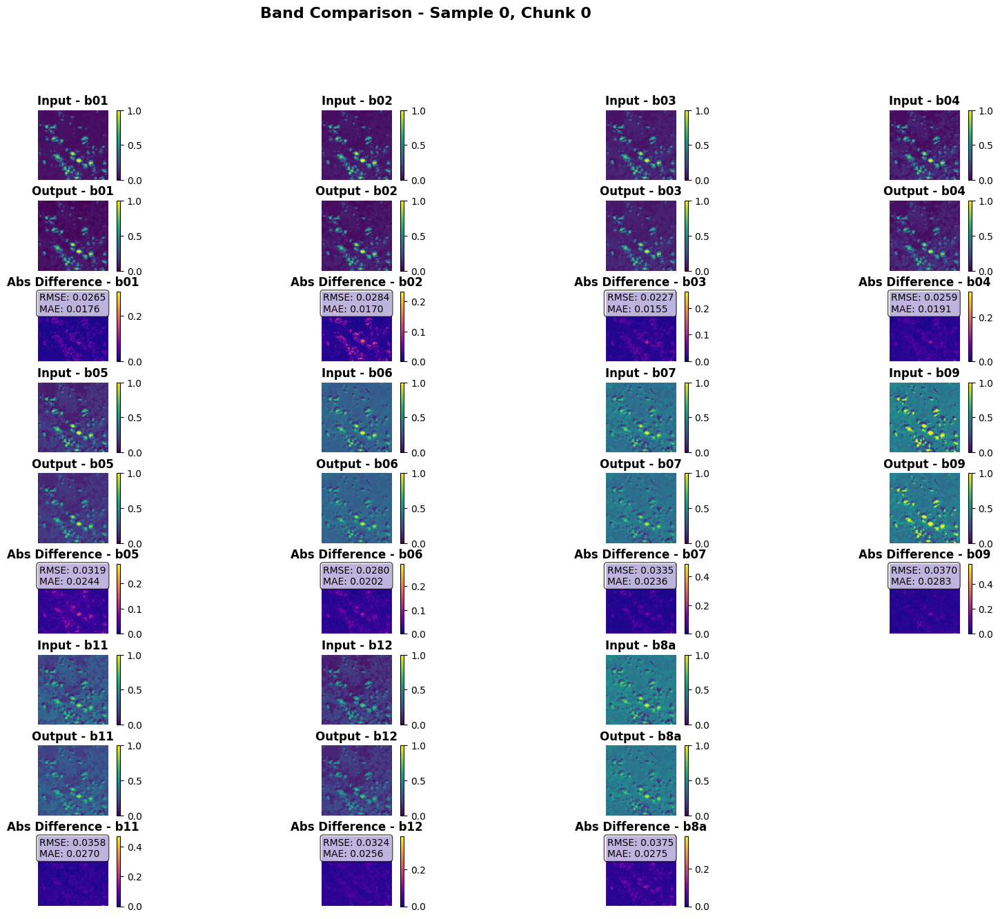


2. RGB composite visualization:
   Using: Reconstruction from batch 0


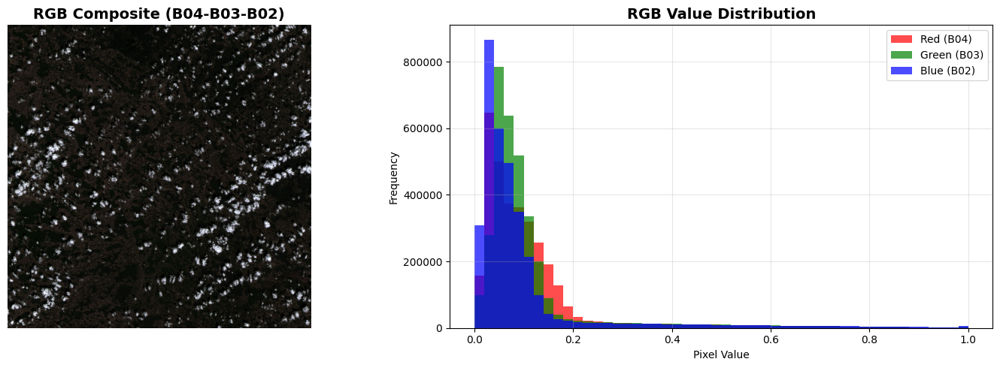


3. Compression analysis:
Using: Batch 1


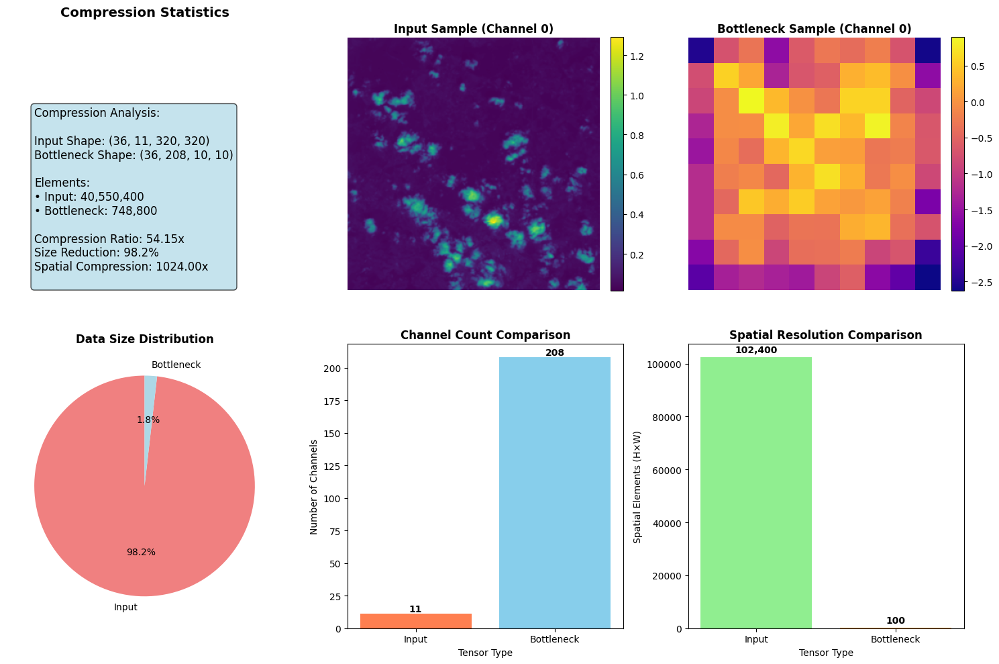

In [11]:
print("Generating comprehensive visual analysis...")

# Configuration for analysis - modify these values as needed
ANALYSIS_BATCH_INDEX = 1    # Select which batch to analyze (0 to len(all_outputs)-1)
ANALYSIS_CHUNK_INDEX = 0    # Select which chunk for detailed analysis (0 to ~35)

# Validate batch index
if ANALYSIS_BATCH_INDEX >= len(all_outputs):
    print(f"Warning: ANALYSIS_BATCH_INDEX ({ANALYSIS_BATCH_INDEX}) exceeds available batches ({len(all_outputs)})")
    ANALYSIS_BATCH_INDEX = 0
    print(f"   Defaulting to batch index: {ANALYSIS_BATCH_INDEX}")

# Validate chunk index
if len(all_inputs) > ANALYSIS_BATCH_INDEX:
    max_chunks = all_inputs[ANALYSIS_BATCH_INDEX].shape[0]
    if ANALYSIS_CHUNK_INDEX >= max_chunks:
        print(f"Warning: ANALYSIS_CHUNK_INDEX ({ANALYSIS_CHUNK_INDEX}) exceeds available chunks ({max_chunks})")
        ANALYSIS_CHUNK_INDEX = 0
        print(f"   Defaulting to chunk index: {ANALYSIS_CHUNK_INDEX}")

# Validate reconstruction index
if len(reconstructions) > 0 and ANALYSIS_BATCH_INDEX >= len(reconstructions):
    print(f"Warning: Reconstruction not available for batch {ANALYSIS_BATCH_INDEX}")
    reconstruction_batch = min(ANALYSIS_BATCH_INDEX, len(reconstructions) - 1)
else:
    reconstruction_batch = ANALYSIS_BATCH_INDEX

print(f"\nAnalysis Configuration:")
print(f"Batch Index: {ANALYSIS_BATCH_INDEX} (available: 0 to {len(all_outputs)-1})")
if len(all_inputs) > ANALYSIS_BATCH_INDEX:
    print(f"Chunk Index: {ANALYSIS_CHUNK_INDEX} (available: 0 to {all_inputs[ANALYSIS_BATCH_INDEX].shape[0]-1})")
    print(f"Selected batch shape: {all_inputs[ANALYSIS_BATCH_INDEX].shape}")
print(f"Reconstruction batch: {reconstruction_batch}")

# 1. Comprehensive band comparison
print(f"\n1. Band-by-band comparison:")
print(f"   Using: Batch {ANALYSIS_BATCH_INDEX}, Chunk {ANALYSIS_CHUNK_INDEX}")
if all_inputs and all_outputs:
    create_comprehensive_comparison_plot(
        all_inputs[ANALYSIS_BATCH_INDEX], all_outputs[ANALYSIS_BATCH_INDEX], bands,
        sample_idx=0, chunk_idx=ANALYSIS_CHUNK_INDEX
    )

# 2. RGB composite visualization
print(f"\n2. RGB composite visualization:")
print(f"   Using: Reconstruction from batch {reconstruction_batch}")
if reconstructions and len(reconstructions) > reconstruction_batch:
    plot_rgb_composite(reconstructions[reconstruction_batch], bands)
else:
    print("No reconstruction available for RGB composite")

# 3. Compression analysis visualization
print(f"\n3. Compression analysis:")
print(f"Using: Batch {ANALYSIS_BATCH_INDEX}")
if all_inputs and all_bottleneck and ANALYSIS_BATCH_INDEX < len(all_bottleneck):
    plot_compression_analysis(all_inputs[ANALYSIS_BATCH_INDEX], all_bottleneck[ANALYSIS_BATCH_INDEX])
else:
    print("Compression analysis data not available")

## 8. Metrics Visualization and Analysis

### Advanced Metrics Plots and 3D Analysis

In [12]:
df_test_output.head()

,id_key,Name,S3Path,Footprint,GeoFootprint,cloud_cover,path,processing_baseline,valid_pixel,psnr_b01,...,ssim_b11,sam_b11,psnr_b12,rmse_b12,ssim_b12,sam_b12,psnr_b8a,rmse_b8a,ssim_b8a,sam_b8a
0,S2A_MSIL1C_20210903T102021_N0500_R065_T32TMR,S2A_MSIL2A_20210903T102021_N0500_R065_T32TMR_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2021/09/0...,geography'SRID=4326;POLYGON ((7.70695108472353...,"{'type': 'Polygon', 'coordinates': [[[7.706951...",34.746963,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,99.999940,27.748024,...,0.816479,0.123099,29.263971,0.034419,0.829583,0.169239,28.360863,0.038191,0.856623,0.084125
1,S2B_MSIL1C_20180702T104019_N0500_R008_T31TFM,S2B_MSIL2A_20180702T104019_N0500_R008_T31TFM_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2018/07/0...,geography'SRID=4326;POLYGON ((4.31403528037438...,"{'type': 'Polygon', 'coordinates': [[[4.314035...",8.212475,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,32.652138,...,0.814569,0.114756,30.258106,0.030697,0.843643,0.153179,29.989115,0.031662,0.866605,0.070448
2,S2B_MSIL1C_20180726T102019_N0500_R065_T32UPA,S2B_MSIL2A_20180726T102019_N0500_R065_T32UPA_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2018/07/2...,geography'SRID=4326;POLYGON ((10.4113495060493...,"{'type': 'Polygon', 'coordinates': [[[10.41134...",14.940278,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,30.437412,...,0.813031,0.139611,28.591667,0.037189,0.818505,0.180413,29.556105,0.033281,0.859642,0.096409
3,S2B_MSIL1C_20210815T103629_N0500_R008_T31UFP,S2B_MSIL2A_20210815T103629_N0500_R008_T31UFP_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2021/08/1...,geography'SRID=4326;POLYGON ((4.36027924628366...,"{'type': 'Polygon', 'coordinates': [[[4.360279...",34.562334,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,100.000000,28.128328,...,0.832787,0.121265,27.923780,0.040162,0.836280,0.173582,28.581669,0.037232,0.874104,0.083385
4,S2A_MSIL1C_20191206T103421_N0500_R108_T31TGL,S2A_MSIL2A_20191206T103421_N0500_R108_T31TGL_2...,s3://eodata/Sentinel-2/MSI/L2A_N0500/2019/12/0...,geography'SRID=4326;POLYGON ((5.58354883959714...,"{'type': 'Polygon', 'coordinates': [[[5.583548...",2.255814,/mnt/disk/dataset/sentinel-ai-processor/V4/tra...,500,99.999821,19.472582,...,0.657600,0.415912,27.907505,0.040237,0.675807,0.468111,23.976425,0.063267,0.807369,0.136591


In [13]:
def create_generalized_3d_metrics_plot(df, bands, x_metric='psnr', y_metric='ssim', z_metric='cloud_cover'):
    """
    Create generalized 3D scatter plot from df_test_output with all bands.

    Args:
        df (pandas.DataFrame): df_test_output with metrics columns
        bands (list): List of band names
        x_metric (str): Metric for x-axis ('psnr', 'ssim', 'sam', 'rmse')
        y_metric (str): Metric for y-axis ('psnr', 'ssim', 'sam', 'rmse')
        z_metric (str): Metric for z-axis ('cloud_cover' or any other column)

    Returns:
        plotly figure: Interactive 3D plot
    """
    import plotly.express as px
    import plotly.graph_objects as go

    # Prepare data for all bands
    plot_data = []

    for idx, row in df.iterrows():
        scene_id = row['id_key']
        cloud_cover = row.get('cloud_cover', 0)

        for band in bands:
            # Get metric values for this band
            x_val = row.get(f'{x_metric}_{band}', None)
            y_val = row.get(f'{y_metric}_{band}', None)

            # Handle z_metric - could be cloud_cover or another metric
            if z_metric == 'cloud_cover':
                z_val = cloud_cover
            else:
                z_val = row.get(f'{z_metric}_{band}', None)

            # Only add if all values are available
            if x_val is not None and y_val is not None and z_val is not None:
                plot_data.append({
                    'band': band,
                    'scene_id': scene_id,
                    'x_val': x_val,
                    'y_val': y_val,
                    'z_val': z_val,
                    'cloud_cover': cloud_cover
                })

    if not plot_data:
        print("No valid data available for 3D visualization")
        return None

    # Create DataFrame for plotting
    plot_df = pd.DataFrame(plot_data)

    # Define labels
    metric_labels = {
        'psnr': 'PSNR [dB]',
        'ssim': 'SSIM',
        'sam': 'SAM [rad]',
        'rmse': 'RMSE',
        'cloud_cover': 'Cloud Cover (%)'
    }

    labels = {
        'x_val': metric_labels.get(x_metric, x_metric),
        'y_val': metric_labels.get(y_metric, y_metric),
        'z_val': metric_labels.get(z_metric, z_metric)
    }

    # Create 3D scatter plot with band coloring
    fig = px.scatter_3d(
        plot_df,
        x='x_val',
        y='y_val',
        z='z_val',
        color='band',
        hover_data=['scene_id', 'cloud_cover'],
        labels=labels,
        title=f'{labels["x_val"]} vs {labels["y_val"]} vs {labels["z_val"]} (All Bands)',
        opacity=0.8
    )

    # Update traces for better visibility and hover info
    fig.update_traces(
        marker=dict(size=6),
        hovertemplate=
                      f'{labels["x_val"]}: %{{x:.2f}}<br>' +
                      f'{labels["y_val"]}: %{{y:.4f}}<br>' +
                      f'{labels["z_val"]}: %{{z:.2f}}<br>' +
                      'Scene: %{customdata[0]}<br>' +
                      'Cloud Cover: %{customdata[1]:.1f}%<extra></extra>'
    )

    # Update layout
    fig.update_layout(
        scene=dict(
            xaxis_title=labels['x_val'],
            yaxis_title=labels['y_val'],
            zaxis_title=labels['z_val'],
            xaxis=dict(gridcolor='lightgray'),
            yaxis=dict(gridcolor='lightgray'),
            zaxis=dict(gridcolor='lightgray'),
        ),
        width=1000,
        height=800,
        margin=dict(l=0, r=0, b=0, t=40),
        legend=dict(
            title="Spectral Bands",
            orientation="v",
            yanchor="top",
            y=1,
            xanchor="left",
            x=1.02
        )
    )

    return fig


In [14]:
# Example 1: PSNR vs SSIM vs Cloud Cover
fig1 = create_generalized_3d_metrics_plot(
    df_test_output,
    bands,
    x_metric='psnr',
    y_metric='ssim',
    z_metric='cloud_cover'
)

if fig1:
    fig1.show()
    print("PSNR vs SSIM vs Cloud Cover plot created!")

PSNR vs SSIM vs Cloud Cover plot created!


In [15]:
# Example 2: PSNR vs SSIM vs SAM
fig2 = create_generalized_3d_metrics_plot(
    df_test_output,
    bands,
    x_metric='psnr',
    y_metric='ssim',
    z_metric='sam'
)

if fig2:
    fig2.show()
    print("PSNR vs SSIM vs SAM plot created!")

print(f"\nPlot contains {len(df_test_output) * len(bands)} data points:")
print(f"- {len(df_test_output)} scenes")
print(f"- {len(bands)} bands each")
print(f"- Each point colored by band")
print(f"- Hover shows scene ID and cloud cover info")

PSNR vs SSIM vs SAM plot created!

Plot contains 550 data points:
- 50 scenes
- 11 bands each
- Each point colored by band
- Hover shows scene ID and cloud cover info
